In [2]:
# Initial imports
import pandas as pd
from sklearn.cluster import KMeans
import plotly.express as px
!pip install hvplot
import hvplot.pandas


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 5.1 MB/s 


In [4]:
import os
spark_version = 'spark-3.2.2'
os.environ['SPARK_VERSION']=spark_version

# Install Spark and Java
!apt-get update
!apt-get install openjdk-11-jdk-headless -qq > /dev/null
!wget -q http://www.apache.org/dist/spark/$SPARK_VERSION/$SPARK_VERSION-bin-hadoop2.7.tgz
!tar xf $SPARK_VERSION-bin-hadoop2.7.tgz
!pip install -q findspark

# Set Environment Variables
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-11-openjdk-amd64"
os.environ["SPARK_HOME"] = f"/content/{spark_version}-bin-hadoop2.7"

# Start a SparkSession
import findspark
findspark.init()

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:10 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [1,540 kB]
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:13 http://se

In [5]:
# Add drivers to Spark
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName("Kmeans_exploration").config("spark.driver.extraClassPath","/content/postgresql-42.2.16.jar").getOrCreate()

In [6]:
# Read in data from S3 Buckets
from pyspark import SparkFiles
url ="https://uaresources.s3.us-west-1.amazonaws.com/sentiment_joined_events_twitter_post_ml.csv"

spark.sparkContext.addFile(url)
joined_data_df = spark.read.csv(SparkFiles.get("sentiment_joined_events_twitter_post_ml.csv"), sep=",", header=True, inferSchema=True)


# Show DataFrame
joined_data_df.show(5)

+---+---------------+---------+---------+-----------+-------------+--------------+------------+--------------------+--------+--------------+----------+---------------+-----------+----------+--------------+-------------+-------+--------------------+-------------------+-------------------+--------------------+
|_c0|       username|following|followers|totaltweets|usercreatedts|tweetcreatedts|retweetcount|            hashtags|language|favorite_count|is_retweet|is_quote_status|extractedts|weekofyear|date_published|search_result| weight|        cleaned_text|           negative|            neutral|            positive|
+---+---------------+---------+---------+-----------+-------------+--------------+------------+--------------------+--------+--------------+----------+---------------+-----------+----------+--------------+-------------+-------+--------------------+-------------------+-------------------+--------------------+
|  0|      WashTimes|   1893.0| 417389.0|   335685.0|   2008-05-05|   

## New joined dataset with sentiments

In [7]:
# convert spark dataframe to pandas
joined_events_twitter_df = joined_data_df.toPandas()
joined_events_twitter_df.head()

,_c0,username,following,followers,totaltweets,usercreatedts,tweetcreatedts,retweetcount,hashtags,language,...,is_quote_status,extractedts,weekofyear,date_published,search_result,weight,cleaned_text,negative,neutral,positive
0,0,WashTimes,1893.0,417389.0,335685.0,2008-05-05,2022-02-26,0.0,"[{'text': 'UkraineCrisis', 'indices': [102, 11...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,democrats urge biden to counter pain at pump w...,0.222473,0.747085,0.030443
1,1,jacarroll,64.0,254.0,110.0,2008-01-07,2022-02-26,0.0,"[{'text': 'StandWithUkriane', 'indices': [58, ...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,now is the time to annex cuba just sayin,0.078324,0.799905,0.121771
2,2,axelk,5766.0,5329.0,119448.0,2007-06-14,2022-02-26,4.0,[],en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,just grasping at straws here but does anyone h...,0.147500,0.824443,0.028057
3,3,ds2719,294.0,172.0,15270.0,2007-07-21,2022-02-26,894.0,[],en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,this is huge russia will be expelled from the ...,0.883955,0.109929,0.006116
4,4,scholar_at_arms,975.0,75.0,1988.0,2008-09-26,2022-02-26,0.0,"[{'text': 'KyivDefiant', 'indices': [18, 30]},...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,please take care,0.063437,0.643451,0.293113


In [8]:
joined_events_twitter_df.tail()

,_c0,username,following,followers,totaltweets,usercreatedts,tweetcreatedts,retweetcount,hashtags,language,...,is_quote_status,extractedts,weekofyear,date_published,search_result,weight,cleaned_text,negative,neutral,positive
713004,713004,gormulus,405.0,267.0,19371.0,2008-05-27,2022-02-26,7.0,"[{'text': 'Russia', 'indices': [25, 32]}]",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,shame on the country that gave the world tcha...,0.850313,0.136375,0.013312
713005,713005,OnTheHudsonNYC,4120.0,796.0,49801.0,2008-12-30,2022-02-26,39.0,"[{'text': 'Ukraine', 'indices': [26, 34]}, {'t...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,lviv people are waiting for a train to poland,0.215897,0.735084,0.049019
713006,713006,MartinsLusis,856.0,1332.0,21349.0,2008-04-28,2022-02-26,244.0,"[{'text': 'EU', 'indices': [20, 23]}, {'text':...",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,all countries are ready to close airspace to ...,0.175344,0.777475,0.047181
713007,713007,NeilMackay,5736.0,22621.0,46051.0,2008-12-10,2022-02-26,94.0,"[{'text': 'Ukraine', 'indices': [112, 120]}]",en,...,None,2022-02-26,8.0,2022-02-26,106000.0,0.000533,hackers have hacked russian state tv channels ...,0.711027,0.282538,0.006435
713008,713008,None,NaN,NaN,NaN,None,None,NaN,None,None,...,None,None,NaN,2022-05-08,101000.0,0.000508,nan,0.239502,0.528189,0.232309


In [9]:
joined_events_twitter_df.sample(15)

,_c0,username,following,followers,totaltweets,usercreatedts,tweetcreatedts,retweetcount,hashtags,language,...,is_quote_status,extractedts,weekofyear,date_published,search_result,weight,cleaned_text,negative,neutral,positive
519141,519141,rfbryant,771.0,935.0,37392.0,2008-08-25,2022-06-03,1.0,"[{'text': 'soundcloud', 'indices': [96, 107]},...",en,...,False,2022-06-03,22.0,2022-06-03,340000.0,0.001709,google podcast listeners can now tune in to l...,0.002000,0.312017,0.685982
375520,375520,Iko_Nal,4989.0,1613.0,45995.0,2008-03-25,2022-04-28,1254.0,"[{'text': 'Ukraine', 'indices': [89, 97]}]",en,...,False,2022-04-28,17.0,2022-04-28,164000.0,0.000824,can someone bomb this fucker into oblivion ask...,0.947824,0.049923,0.002253
236074,236074,dark5un,473.0,775.0,13923.0,2007-05-20,2022-04-03,137.0,[],en,...,None,2022-04-03,13.0,2022-04-03,102000.0,0.000513,long story short gotabaya rajapaksha bankster...,0.192391,0.717217,0.090392
553245,553245,pauloalves,1017.0,1016.0,55408.0,2008-09-04,2022-06-12,1534.0,[],en,...,False,2022-06-12,23.0,2022-06-12,156000.0,0.000784,this guy just invited me to invade russia no t...,0.672396,0.290068,0.037536
204233,204233,PremaNihan,609.0,467.0,16512.0,2008-05-13,2022-03-27,2402.0,[],en,...,None,2022-03-27,12.0,2022-03-27,92900.0,0.000467,this is london united kingdom it is very impor...,0.146112,0.547928,0.305960
329848,329848,Finbow,1404.0,296.0,32321.0,2008-11-26,2022-04-19,172.0,[],en,...,None,2022-04-19,16.0,2022-04-19,244000.0,0.001226,as topanalysts say the protracted war in may c...,0.668846,0.318781,0.012373
240225,240225,Karma_Incarnate,1399.0,1873.0,148064.0,2008-06-06,2022-04-03,1392.0,[],en,...,None,2022-04-03,13.0,2022-04-03,102000.0,0.000513,it is time to isolate president putins russia ...,0.926778,0.070679,0.002543
175956,175956,stephenpalmer,13446.0,14486.0,51824.0,2008-10-31,2022-03-24,88.0,"[{'text': 'Chernobyl', 'indices': [75, 85]}, {...",en,...,None,2022-03-24,12.0,2022-03-24,136000.0,0.000683,air pollution warnings today csium levels ris...,0.855931,0.135650,0.008419
697533,697533,ewinkler,6996.0,6375.0,16278.0,2008-06-25,2022-02-27,135125.0,[],en,...,None,2022-02-27,8.0,2022-02-27,111000.0,0.000558,s tv address to the russian people might be t...,0.002947,0.053863,0.943190
115633,115633,laserhaas01,15781.0,14399.0,247530.0,2008-06-25,2022-03-15,19.0,"[{'text': 'Anonymous', 'indices': [17, 27]}, {...",en,...,None,2022-03-15,11.0,2022-03-15,167000.0,0.000839,1 message many great of anonymous collective d...,0.318419,0.600015,0.081566


## Check to see all the column names to decide which to keep

In [10]:
for col in joined_events_twitter_df.columns:
    print(col)

_c0
username
following
followers
totaltweets
usercreatedts
tweetcreatedts
retweetcount
hashtags
language
favorite_count
is_retweet
is_quote_status
extractedts
weekofyear
date_published
search_result
weight
cleaned_text
negative
neutral
positive


## Drop columns

In [11]:
exploratory_df = joined_events_twitter_df.drop(['username','following','followers','totaltweets','retweetcount','hashtags','language','favorite_count','is_retweet','is_quote_status','extractedts','search_result','weight','cleaned_text'], axis=1)

exploratory_df.reset_index(drop=True, inplace=True)
exploratory_df.head()

,_c0,usercreatedts,tweetcreatedts,weekofyear,date_published,negative,neutral,positive
0,0,2008-05-05,2022-02-26,8.0,2022-02-26,0.222473,0.747085,0.030443
1,1,2008-01-07,2022-02-26,8.0,2022-02-26,0.078324,0.799905,0.121771
2,2,2007-06-14,2022-02-26,8.0,2022-02-26,0.147500,0.824443,0.028057
3,3,2007-07-21,2022-02-26,8.0,2022-02-26,0.883955,0.109929,0.006116
4,4,2008-09-26,2022-02-26,8.0,2022-02-26,0.063437,0.643451,0.293113


In [12]:
exploratory_df = exploratory_df.drop(['_c0','usercreatedts'], axis=1)
exploratory_df.head()

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive
0,2022-02-26,8.0,2022-02-26,0.222473,0.747085,0.030443
1,2022-02-26,8.0,2022-02-26,0.078324,0.799905,0.121771
2,2022-02-26,8.0,2022-02-26,0.147500,0.824443,0.028057
3,2022-02-26,8.0,2022-02-26,0.883955,0.109929,0.006116
4,2022-02-26,8.0,2022-02-26,0.063437,0.643451,0.293113


## Create new dataframe to run Kmeans model and extract labels.
#### I expect to see only 3 labels. Each representing negative, neutral, positive sentiments

In [13]:
sentiment_df = exploratory_df.drop(['tweetcreatedts','weekofyear','date_published'], axis=1)
sentiment_df.head()

,negative,neutral,positive
0,0.222473,0.747085,0.030443
1,0.078324,0.799905,0.121771
2,0.147500,0.824443,0.028057
3,0.883955,0.109929,0.006116
4,0.063437,0.643451,0.293113


In [14]:
# Initializing model with K = 3 (I want to see if I get negative, neutral, positive labels)
model = KMeans(n_clusters=3, random_state=5)
model

KMeans(n_clusters=3, random_state=5)

In [15]:
# Fitting model
model.fit(sentiment_df)

KMeans(n_clusters=3, random_state=5)

In [16]:
# Get the predictions
predictions = model.predict(sentiment_df)
print(predictions)

[0 0 0 ... 0 1 0]


In [17]:
# Add a new class column to the sentiments_df
sentiment_df["class"] = model.labels_
sentiment_df.head()

,negative,neutral,positive,class
0,0.222473,0.747085,0.030443,0
1,0.078324,0.799905,0.121771,0
2,0.147500,0.824443,0.028057,0
3,0.883955,0.109929,0.006116,1
4,0.063437,0.643451,0.293113,0


## Check the labels and the counts of each

In [18]:
sentiment_df['class'].value_counts()

0    318258
1    297663
2     97088
Name: class, dtype: int64

### I expect that these are the sentiment counts for negative, positive and neutral.
Looking at the head of sentiments_df it seems that 0 == neutral. 1 == negative and 2 == positive
Based on the value counts, the majority of tweets are neutral with negative sentiment being the next highest count

## Plot out Negative vs Positive sentiments to see if there may be a pattern

In [19]:
# Negative vs Positive
sentiment_df.hvplot.scatter(x="positive", y="negative", by="class")

:NdOverlay   [class]
   :Scatter   [positive]   (negative)

## Check our tables

In [20]:
exploratory_df.shape

(713009, 6)

In [21]:
sentiment_df.shape

(713009, 4)

In [22]:
exploratory_df.head()

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive
0,2022-02-26,8.0,2022-02-26,0.222473,0.747085,0.030443
1,2022-02-26,8.0,2022-02-26,0.078324,0.799905,0.121771
2,2022-02-26,8.0,2022-02-26,0.147500,0.824443,0.028057
3,2022-02-26,8.0,2022-02-26,0.883955,0.109929,0.006116
4,2022-02-26,8.0,2022-02-26,0.063437,0.643451,0.293113


In [23]:
sentiment_df.head()

,negative,neutral,positive,class
0,0.222473,0.747085,0.030443,0
1,0.078324,0.799905,0.121771,0
2,0.147500,0.824443,0.028057,0
3,0.883955,0.109929,0.006116,1
4,0.063437,0.643451,0.293113,0


## Extract the class column and join to exploratory dataframe

In [24]:
extracted = sentiment_df["class"]
extracted

0         0
1         0
2         0
3         1
4         0
         ..
713004    1
713005    0
713006    0
713007    1
713008    0
Name: class, Length: 713009, dtype: int32

In [25]:
exp_sent_df = exploratory_df.join(extracted)
exp_sent_df.head()

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive,class
0,2022-02-26,8.0,2022-02-26,0.222473,0.747085,0.030443,0
1,2022-02-26,8.0,2022-02-26,0.078324,0.799905,0.121771,0
2,2022-02-26,8.0,2022-02-26,0.147500,0.824443,0.028057,0
3,2022-02-26,8.0,2022-02-26,0.883955,0.109929,0.006116,1
4,2022-02-26,8.0,2022-02-26,0.063437,0.643451,0.293113,0


In [26]:
exp_sent_df.tail()

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive,class
713004,2022-02-26,8.0,2022-02-26,0.850313,0.136375,0.013312,1
713005,2022-02-26,8.0,2022-02-26,0.215897,0.735084,0.049019,0
713006,2022-02-26,8.0,2022-02-26,0.175344,0.777475,0.047181,0
713007,2022-02-26,8.0,2022-02-26,0.711027,0.282538,0.006435,1
713008,None,NaN,2022-05-08,0.239502,0.528189,0.232309,0


In [27]:
exp_sent_df.sample(5)

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive,class
665679,2022-07-29,30.0,2022-07-29,0.549056,0.439308,0.011635,1
255179,2022-04-05,14.0,2022-04-05,0.089351,0.392874,0.517776,2
301482,2022-04-13,15.0,2022-04-13,0.941668,0.055706,0.002626,1
242058,2022-04-03,13.0,2022-04-03,0.163191,0.651876,0.184933,0
663085,2022-07-27,30.0,2022-07-27,0.854796,0.141391,0.003813,1


In [28]:
exp_sent_df.shape

(713009, 7)

In [29]:
exp_sent_df['class'].value_counts()

0    318258
1    297663
2     97088
Name: class, dtype: int64

## Just get all the negative sentiment labeled rows

In [30]:
negatives = exp_sent_df[(exp_sent_df['class']==1)]
negatives

,tweetcreatedts,weekofyear,date_published,negative,neutral,positive,class
3,2022-02-26,8.0,2022-02-26,0.883955,0.109929,0.006116,1
8,2022-02-26,8.0,2022-02-26,0.818743,0.173622,0.007635,1
12,2022-02-26,8.0,2022-02-26,0.707280,0.275940,0.016779,1
14,2022-02-26,8.0,2022-02-26,0.550724,0.436907,0.012370,1
16,2022-02-26,8.0,2022-02-26,0.666204,0.326554,0.007242,1
...,...,...,...,...,...,...,...
712998,2022-02-26,8.0,2022-02-26,0.818743,0.173622,0.007635,1
712999,2022-02-26,8.0,2022-02-26,0.570898,0.415697,0.013405,1
713001,2022-02-26,8.0,2022-02-26,0.818743,0.173622,0.007635,1
713004,2022-02-26,8.0,2022-02-26,0.850313,0.136375,0.013312,1


## Try and see if there is a correlation between Published date of news and Negative sentiment

In [31]:
negatives['class'].value_counts()

1    297663
Name: class, dtype: int64

In [32]:
negatives['tweetcreatedts'].value_counts()

2022-04-03    5033
2022-03-21    4462
2022-04-04    3889
2022-03-07    3763
2022-03-06    3740
              ... 
2022-08-16     200
2022-08-15     173
2022-08-17     171
2022-08-09     161
2022-08-14     112
Name: tweetcreatedts, Length: 175, dtype: int64

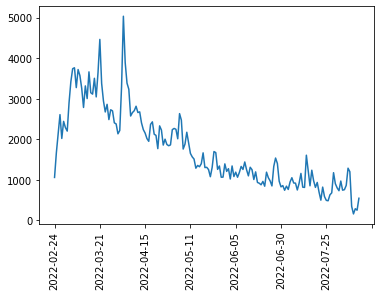

In [35]:
# Trend of published news items by date
negatives['date_published'].value_counts().sort_index(ascending=True).plot.line(rot=90)

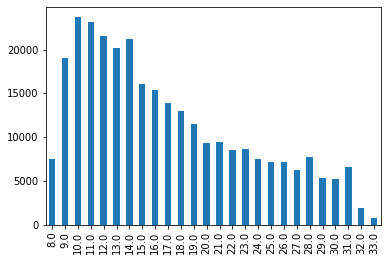

In [36]:
# Counts of negative sentiment tweets by week of the year
negatives['weekofyear'].value_counts().sort_index(ascending=True).plot.bar()

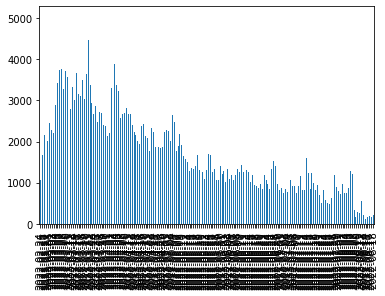

In [37]:
# Count of negative sentiment tweets by when the tweet was created
negatives['tweetcreatedts'].value_counts().sort_index(ascending=True).plot.bar(rot=90)

## As we can see, we can draw a correlation between the amount of negative sentiment tweets and when news about the war publishes